In [6]:
import numpy as np
import scipy
import robust_mean_estimate as rl
import importlib as il
from scipy import special
from numpy import linalg as LA
import matplotlib.pyplot as plt
%matplotlib inline
import mpld3
mpld3.enable_notebook()

fsize = 20
fpad = 10
figsize = (8,4)
fontname = 'fantasy'

In [59]:
"loss, time vs dimension -- T -- dense biased -- set data"

il.reload(rl)

trials = 50

m, k, eps, param = 200, 4, 0.1, 2.74
xs = list(np.arange(10, 110, 10))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.RME_sp, rl.Top_K_Filtered, rl.RME]

model = rl.TModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(m = m, k = k, eps = eps, param = param)

inputfilename = 'data/loss-time-vs-dimension-T.pkl'
plot_d = rl.load_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)
plot_d.setdata_tofile(filename = inputfilename, xvar_name = 'd', trials = trials, xs = xs)

[[10.41654448 -4.53268169 -2.24466624 ... -1.09807439  1.98205187
  -0.19520042]
 [11.52047395 -6.16939859 -2.03215937 ...  1.5626622   0.01494868
   0.08394393]
 [ 8.8703191  -5.64212029 -1.32927789 ... -0.15242455  0.80183647
  -1.19260691]
 ...
 [ 4.70220624 -6.86359579 -5.76562268 ... -3.24187774 -1.88678524
  -2.84070404]
 [ 7.99719499 -7.43169707 -4.121418   ... -2.83707046 -1.46840301
  -3.59432705]
 [ 7.31040669 -6.63827557 -9.25190218 ... -2.72768151 -0.8559094
  -2.41534501]]
Prediction: 4
Prediction: 4
ATTENTION
[[0.8374158472399003],[-5.179148097422016],[-2.312362032702393],[9.714211264575727]]
[3 1 2 0]
[ 5.98066702e-03 -5.98066702e-03 -5.98066702e-03  4.96903607e-05
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
Time to run GD  0.03299403190612793
Linear filter...
Filtered out 0/153, 0.0 false (nan vs 0.1)
Quadratic filter...
Filtered out 0/153, 0.0 false (nan vs 0.1)
condition 153 153
Could not filter
Prediction: 4
Line

/Users/chenruidemac/Documents/GitHub/Robust_mean_estimation/robust_mean_estimate.py:385: RuntimeWarning: invalid value encountered in double_scalars
  f"Filtered out {l - len(idx[0])}/{l}, {bad_filtered} false ({bad_filtered / (l - len(idx[0])):0.2f} vs {self.fdr})")
/Users/chenruidemac/Documents/GitHub/Robust_mean_estimation/robust_mean_estimate.py:403: RuntimeWarning: invalid value encountered in double_scalars
  f"Filtered out {l - len(idx[0])}/{l}, {bad_filtered} false ({bad_filtered / (l - len(idx[0])):0.2f} vs {self.fdr})")
/Users/chenruidemac/Documents/GitHub/Robust_mean_estimation/robust_mean_estimate.py:360: RuntimeWarning: divide by zero encountered in true_divide
  return 8*np.exp(-T**2/2) + 8*eps/((T**2)*np.log(d*np.log(d/eps*tau)))


Prediction: 4
ATTENTION
[[0.8092786311918759],[-5.079365247510776],[-1.8245351211614242],[9.961950563939393]]
[3 1 2 0]
[ 5.98066702e-03 -5.98066702e-03 -5.98066702e-03  7.19538650e-06
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
Time to run GD  0.12123799324035645
Linear filter...
Filtered out 3/117, 0.0 false (0.00 vs 0.1)
Linear filter...
Filtered out 0/114, 0.0 false (nan vs 0.1)
Quadratic filter...
Filtered out 0/114, 0.0 false (nan vs 0.1)
condition 114 114
Could not filter
Prediction: 4
Linear filter...
Filtered out 0/171, 0.0 false (nan vs 0.1)
Quadratic filter...
Filtered out 0/171, 0.0 false (nan vs 0.1)
condition 171 171
Could not filter
Linear filter...
Filtered out 6/117, 0.0 false (0.00 vs 0.1)
Linear filter...
Filtered out 0/111, 0.0 false (nan vs 0.1)
Could 

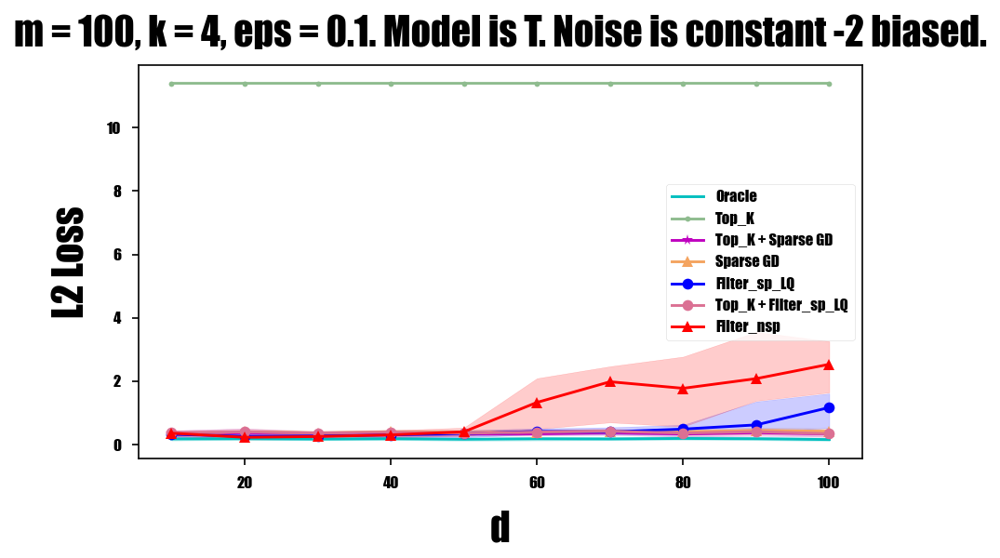

<Figure size 1200x600 with 0 Axes>

In [60]:
"loss vs dimension -- T -- dense biased -- plot"

il.reload(rl)

trials = 50

m, k, eps, param = 100, 4, 0.1, 2.74
xs = list(np.arange(10, 110, 10))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.RME_sp, rl.Top_K_Filtered, rl.RME]

model = rl.TModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(m = m, k = k, eps = eps, param = param)
inputfilename = 'data/loss-time-vs-dimension-T.pkl'
outputfilename = 'figs/loss-vs-dimension-T.pdf'

title = 'm = {m}, k = {k}, eps = {eps}. Model is T. Noise is constant -2 biased.'.format(m = m, k = k, eps = eps)
xlabel = 'd'
ylabel = 'L2 Loss'

plot_d_loss = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_d_loss.plotxy_fromfile(outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)

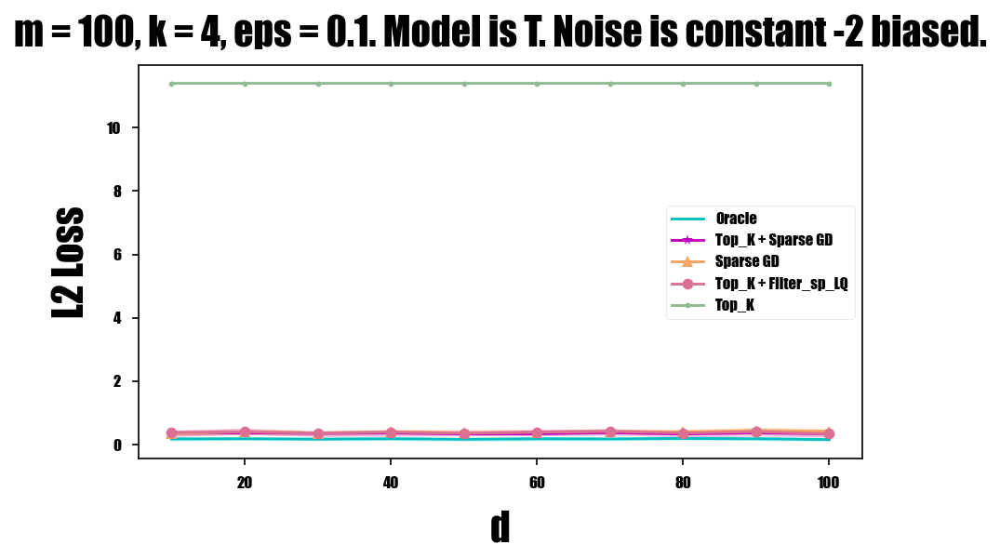

<Figure size 1200x600 with 0 Axes>

In [61]:
"loss vs dimension -- T -- dense biased -- plot -- detailed"

il.reload(rl)

trials = 50

m, k, eps, param = 100, 4, 0.1, 2.74
xs = list(np.arange(10, 110, 10))

keys = [rl.Oracle, rl.Topk_GD, rl.GDAlgs, rl.Top_K_Filtered, rl.Top_K]

model = rl.TModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(m = m, k = k, eps = eps, param = param)
inputfilename = 'data/loss-time-vs-dimension-T.pkl'
outputfilename = 'figs/loss-vs-dimension-T-detailed.pdf'

title = 'm = {m}, k = {k}, eps = {eps}. Model is T. Noise is constant -2 biased.'.format(m = m, k = k, eps = eps)
xlabel = 'd'
ylabel = 'L2 Loss'

plot_d_loss = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_d_loss.plotxy_fromfile(outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)

In [ ]:
"time vs dimension -- T -- dense biased -- plot"

il.reload(rl)

trials = 50

m, k, eps, param = 100, 4, 0.1, 2.74
xs = list(np.arange(100, 400, 10))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.RME_sp, rl.Top_K_Filtered, rl.RME]

model = rl.TModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(m = m, k = k, eps = eps, param = param)

outputfilename = 'figs/time-vs-dimension-T.pdf'
inputfilename = 'data/loss-time-vs-dimension-T.pkl'
title = 'm = {m}, k = {k}, eps = {eps}. Model is T. Noise is constant -2 biased.'.format(m = m, k = k, eps = eps)
xlabel = 'd'
ylabel = 'Time'

plot_d_time = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_d_time.plotxy_fromfile_time(outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)

In [ ]:
"time vs dimension -- T -- dense biased -- plot -- detailed"

il.reload(rl)

trials = 50

m, k, eps, param = 100, 4, 0.1, 2.74
xs = list(np.arange(100, 400, 10))

keys = [rl.Oracle, rl.RME_sp, rl.RME]

model = rl.TModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(m = m, k = k, eps = eps, param = param)

outputfilename = 'figs/time-vs-dimension-T-detailed.pdf'
inputfilename = 'data/loss-time-vs-dimension-T.pkl'
title = 'm = {m}, k = {k}, eps = {eps}. Model is T. Noise is constant -2 biased.'.format(m = m, k = k, eps = eps)
xlabel = 'd'
ylabel = 'Time'

plot_d_time = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_d_time.plotxy_fromfile_time(outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)

In [8]:
"loss, time vs sparsity -- T -- dense biased -- set data"

il.reload(rl)

trials = 50

m, d, eps, param = 200, 100, 0.1, 2.74
xs = list(np.arange(4, 100, 4))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.RME_sp, rl.Top_K_Filtered, rl.RME]

model = rl.TModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(m = m, d = d, eps = eps, param = param)

inputfilename = 'data/loss-time-vs-sparsity-T.pkl'
plot_k = rl.load_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)
plot_k.setdata_tofile(filename = inputfilename, xvar_name = 'k', trials = trials, xs = xs)

[[ 0.52995738  0.72707779  2.41615212 ...  1.13788146 -1.44282974
   0.23815656]
 [ 1.24070426  0.46742626  3.56363046 ... -1.29183696 -0.19282072
   0.64107774]
 [ 4.34441511 -0.18796157  2.37022593 ... -0.64864026  2.12041569
   1.17328048]
 ...
 [-0.38856407  1.75755945  0.12338044 ... -2.26604323 -2.17353152
  -2.62576487]
 [-0.78223541 -0.64175613  0.30213607 ... -0.84156271 -0.89621362
  -2.11755669]
 [ 0.04159686  0.73480955 -2.12609032 ... -4.14809436 -1.88463493
  -0.9721984 ]]
ATTENTION
[[0.8697279087129516],[1.0256315548809347],[0.9458946316462602],[0.9178556133795917]]
[2 0 1 3]
[ 8.86904737e-01  1.03378414e+00  8.74571680e-01  9.21404098e-01
 -1.42232383e-01 -1.09521998e-01 -7.23924787e-06 -2.88756694e-03
  5.41460901e-05 -2.88756694e-03  3.96258008e-04  7.23924787e-06
  0.00000000e+00 -7.23924787e-06 -3.07663069e-01 -2.88756694e-03
 -5.41460901e-05 -3.96258008e-04  0.00000000e+00 -2.09591556e-02
 -2.99901433e-04 -5.41460901e-05 -5.41460901e-05 -1.31058248e-01
  2.74224163

/Users/chenruidemac/Documents/GitHub/Robust_mean_estimation/robust_mean_estimate.py:382: RuntimeWarning: invalid value encountered in double_scalars
  else:
/Users/chenruidemac/Documents/GitHub/Robust_mean_estimation/robust_mean_estimate.py:400: RuntimeWarning: invalid value encountered in double_scalars
  else:


Linear filter...
Filtered out 2/166, 0.0 false (0.00 vs 0.1)
Linear filter...
Filtered out 0/164, 0.0 false (nan vs 0.1)
Quadratic filter...
Filtered out 0/164, 0.0 false (nan vs 0.1)
condition 164 164
Could not filter
Linear filter...
Filtered out 4/23, 4.0 false (1.00 vs 0.1)


/Users/chenruidemac/Documents/GitHub/Robust_mean_estimation/robust_mean_estimate.py:357: RuntimeWarning: divide by zero encountered in true_divide
  def linear_filter(self, S, indicator, ev, v, u):


Linear filter...
Filtered out 10/19, 10.0 false (1.00 vs 0.1)
Linear filter...
Filtered out 5/9, 5.0 false (1.00 vs 0.1)
Linear filter...
Filtered out 2/4, 2.0 false (1.00 vs 0.1)
Linear filter...
Filtered out 0/2, 0.0 false (nan vs 0.1)
Could not filter
[[ 0.60267402  1.67568114  0.90534801 ... -1.11210832 -0.15235201
  -1.75504616]
 [ 0.52140588  1.53388872 -0.25489263 ... -0.63097784  0.21529105
  -0.88112067]
 [ 1.13306131  1.09745337  1.5338114  ...  0.342744   -0.2929348
  -1.29544811]
 ...
 [-2.01309859 -2.20944903 -0.35754353 ... -2.49416379 -3.2267796
  -1.5795012 ]
 [ 1.23404586 -1.4987118  -1.579071   ... -2.62798952 -1.40284188
  -0.06479485]
 [-0.60200119  0.07462671 -2.31591882 ... -1.97757641 -2.29415237
  -3.00998073]]
ATTENTION
[[0.8257841828285074],[0.989454852313022],[0.9590714558214242],[0.9360641447144904],[0.8344273046735484],[0.9764471937535664],[0.883539556584944],[0.9306496577322669]]
[6 0 7 1 4 3 2 5]
[ 8.07713133e-01  9.34349223e-01  8.18825722e-01  1.0412008

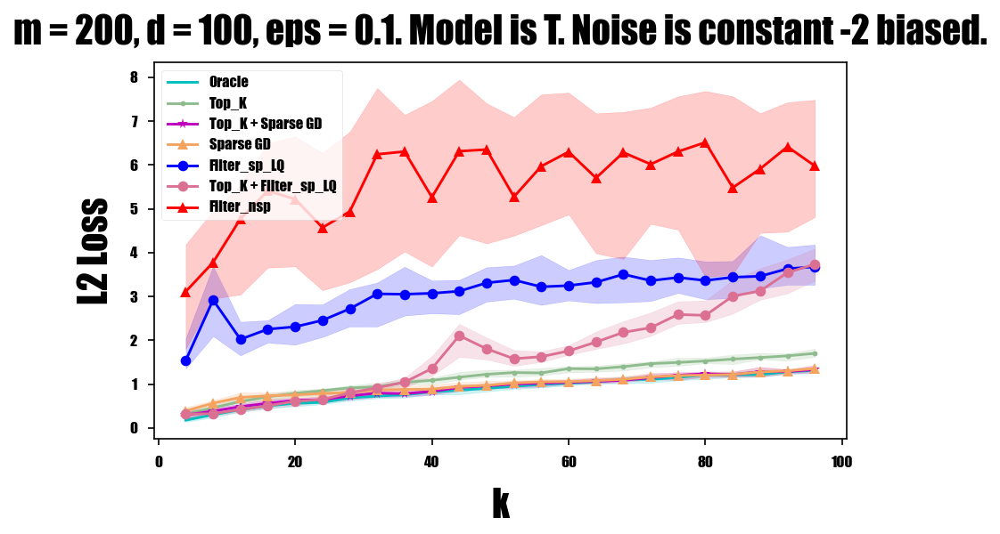

<Figure size 1200x600 with 0 Axes>

In [13]:
"loss vs sparsity -- T -- dense biased -- plot"

il.reload(rl)

trials = 50

m, d, eps, param = 200, 100, 0.1, 2.74
xs = list(np.arange(4, 100, 4))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.RME_sp, rl.Top_K_Filtered, rl.RME]

model = rl.TModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(m = m, d = d, eps = eps, param = param)
inputfilename = 'data/loss-time-vs-sparsity-T.pkl'
outputfilename = 'figs/loss-vs-sparsity-T.pdf'

title = 'm = {m}, d = {d}, eps = {eps}. Model is T. Noise is constant -2 biased.'.format(m = m, d = d, eps = eps)
xlabel = 'k'
ylabel = 'L2 Loss'

plot_k_loss = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_k_loss.plotxy_fromfile(yscale = 'linear', outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)

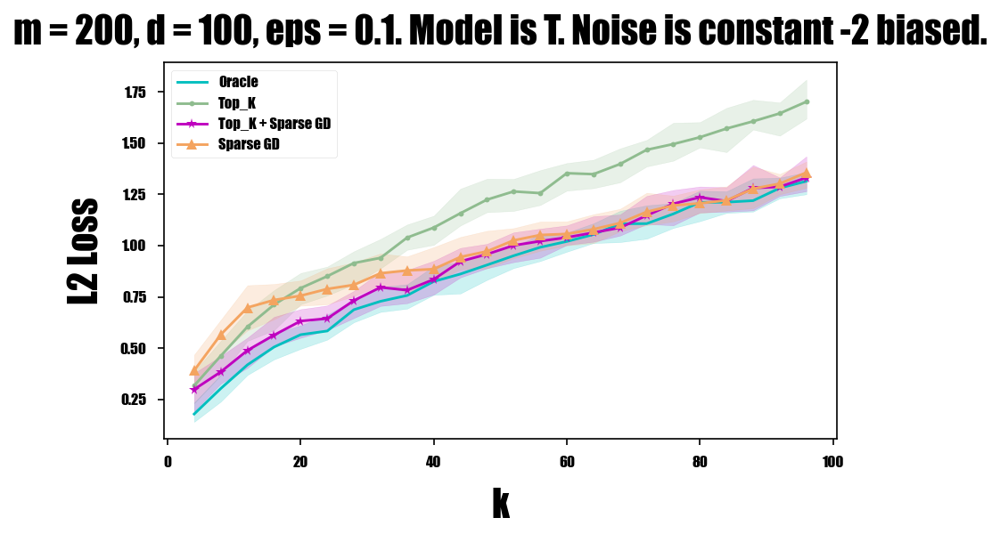

<Figure size 1200x600 with 0 Axes>

In [14]:
"loss vs sparsity -- T -- dense biased -- plot -- detailed"

il.reload(rl)

trials = 50

m, d, eps, param = 200, 100, 0.1, 2.74
xs = list(np.arange(4, 100, 4))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs]

model = rl.TModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(m = m, d = d, eps = eps, param = param)
inputfilename = 'data/loss-time-vs-sparsity-T.pkl'
outputfilename = 'figs/loss-vs-sparsity-T-detailed.pdf'

title = 'm = {m}, d = {d}, eps = {eps}. Model is T. Noise is constant -2 biased.'.format(m = m, d = d, eps = eps)
xlabel = 'k'
ylabel = 'L2 Loss'

plot_k_loss = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_k_loss.plotxy_fromfile(outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)

In [ ]:
"time vs sparsity -- T -- dense biased -- plot"

il.reload(rl)

trials = 50

m, d, eps, param = 200, 100, 0.1, 2.74
xs = list(np.arange(4, 100, 4))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.RME_sp, rl.Top_K_Filtered, rl.RME]

model = rl.TModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(m = m, d = d, eps = eps, param = param)
inputfilename = 'data/loss-time-vs-sparsity-T.pkl'
outputfilename = 'figs/time-vs-sparsity-T.pdf'

title = 'm = {m}, d = {d}, eps = {eps}. Model is T. Noise is constant -2 biased.'.format(m = m, d = d, eps = eps)
xlabel = 'k'
ylabel = 'Time'

plot_k_time = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_k_time.plotxy_fromfile_time(outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)

In [ ]:
"time vs sparsity -- T -- dense biased -- plot -- detailed"

il.reload(rl)

trials = 50

m, d, eps, param = 200, 100, 0.1, 2.74
xs = list(np.arange(4, 100, 4))

keys = [rl.Oracle, rl.RME_sp, rl.RME]

model = rl.TModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(m = m, d = d, eps = eps, param = param)
inputfilename = 'data/loss-time-vs-sparsity-T.pkl'
outputfilename = 'figs/time-vs-sparsity-T-detailed.pdf'

title = 'm = {m}, d = {d}, eps = {eps}. Model is T. Noise is constant -2 biased.'.format(m = m, d = d, eps = eps)
xlabel = 'k'
ylabel = 'Time'

plot_k_time = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_k_time.plotxy_fromfile_time(outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)

In [37]:
"loss, time vs sample -- T -- dense biased -- set data"

il.reload(rl)

trials = 50

d, k, eps, param = 100, 4, 0.1, 2.74
xs = list(np.arange(50, 1000, 50))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.RME_sp, rl.Top_K_Filtered, rl.RME]

model = rl.TModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(d = d, k = k, eps = eps, param = param)

inputfilename = 'data/loss-time-vs-sample-T.pkl'
plot_m = rl.load_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)
plot_m.setdata_tofile(filename = inputfilename, xvar_name = 'm', trials = trials, xs = xs)

[[ 8.14364542 -5.7960456  -1.28719928 ... -0.38470325  1.63590508
  -0.52848819]
 [ 9.73347547 -5.50131423 -2.75695349 ... -0.46591267  1.15284524
   1.28680462]
 [10.33391166 -5.25059607 -3.63363659 ... -3.21446734  1.91215966
  -0.27625259]
 ...
 [10.06492823 -6.19995638 -3.8691694  ... -2.77304707 -0.9030971
  -3.8912121 ]
 [ 9.27508847 -6.32019923 -3.92829091 ... -2.31266806 -1.80223969
  -0.52871489]
 [ 8.61750431 -5.94640276 -1.86683586 ... -2.18759896 -1.84328574
  -5.2652272 ]]
Prediction: 73
Prediction: 20
ATTENTION
[[-0.1118672372809015],[-0.4266381779036915],[-0.4878360964714175],[-0.49085774636409263],[-0.42747168818460274],[-0.5207286674250873],[-0.450442025564743],[-0.10491132626787711],[-0.2029529898832609],[0.07398385308211969],[-0.4098201129062792],[0.34019912735823316],[-0.7742732080471786],[0.3227128085167595],[-5.083009605273832],[-0.32004774215433573],[0.3166154061634348],[1.0276428697419344],[-2.0062669167857843],[9.767881291689005]]
[96 26 61 70  5 80 38 42 43 99

/Users/chenruidemac/Documents/GitHub/Robust_mean_estimation/robust_mean_estimate.py:385: RuntimeWarning: invalid value encountered in double_scalars
  f"Filtered out {l - len(idx[0])}/{l}, {bad_filtered} false ({bad_filtered / (l - len(idx[0])):0.2f} vs {self.fdr})")
/Users/chenruidemac/Documents/GitHub/Robust_mean_estimation/robust_mean_estimate.py:403: RuntimeWarning: invalid value encountered in double_scalars
  f"Filtered out {l - len(idx[0])}/{l}, {bad_filtered} false ({bad_filtered / (l - len(idx[0])):0.2f} vs {self.fdr})")


Prediction: 71
Prediction: 17
ATTENTION
[[-0.36621699832749727],[-0.12577341203443929],[-0.22583635132634566],[0.26352970284819693],[-0.46971572064971445],[-0.2847171957090912],[-0.4781058804672541],[0.22104155512015314],[-0.3920451860749154],[-0.3915810747634373],[-0.3712686683689733],[-0.44935580462944696],[-5.067822852817127],[0.9560367242910336],[-2.1627961112650285],[-0.3940597271589235],[10.385390327844284]]
[15 63 68 47 61 37 39 98  7 26 92 65  1  3  2 48  0]
[ 1.02710736e+01 -5.13515894e+00 -2.08107189e+00  8.74236080e-01
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -2.32988884e-02
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -1.25635091e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -2.78851246e-02  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000

/Users/chenruidemac/Documents/GitHub/Robust_mean_estimation/robust_mean_estimate.py:360: RuntimeWarning: divide by zero encountered in true_divide
  return 8*np.exp(-T**2/2) + 8*eps/((T**2)*np.log(d*np.log(d/eps*tau)))


Linear filter...
Filtered out 3/7, 3.0 false (1.00 vs 0.1)
Linear filter...
Filtered out 0/4, 0.0 false (nan vs 0.1)
Could not filter
[[11.12673792 -6.11975297 -1.92177351 ... -0.71062532 -0.27930672
   0.43077338]
 [11.81200588 -3.26599219 -0.29333485 ... -0.22680553  0.21989842
   0.87664233]
 [ 9.87017681 -3.97440115 -1.75341918 ...  0.8022907   0.19576104
  -1.14629832]
 ...
 [ 6.74886307 -6.89401413 -4.42813238 ... -1.4590691  -2.99326922
  -2.36968136]
 [10.69557109 -5.64137508 -0.87672026 ... -2.00168026 -2.07029056
  -1.45709735]
 [ 7.91786347 -6.76065577 -4.6377406  ... -0.72229654 -1.98408882
  -1.83751763]]
Prediction: 56
Prediction: 10
ATTENTION
[[-0.31455733109172146],[-0.20785176625090324],[-0.2867642182126684],[-0.2282426151224827],[-0.3693413194453855],[-0.41843526091187117],[-5.123927246049362],[0.8586013022815218],[-1.9597675860555825],[9.980343199562514]]
[69 63 49 99 79 62  1  3  2  0]
[ 9.84210345e+00 -5.07608189e+00 -1.86949278e+00  4.29435550e-01
  0.00000000e+00

KeyboardInterrupt: 

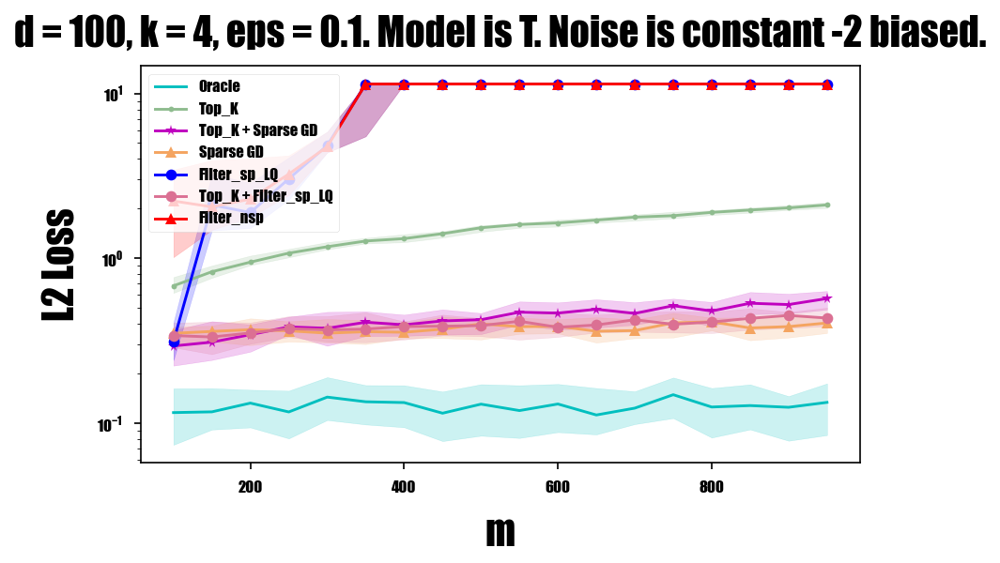

<Figure size 1200x600 with 0 Axes>

In [35]:
"loss vs sample -- T -- dense biased -- plot"

il.reload(rl)

trials = 50

d, k, eps, param = 100, 4, 0.1, 2.74
xs = list(np.arange(100, 1000, 50))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.RME_sp, rl.Top_K_Filtered, rl.RME]

model = rl.TModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(d = d, k = k, eps = eps, param = param)
inputfilename = 'data/loss-time-vs-sample-T.pkl'
outputfilename = 'figs/loss-vs-sample-T.pdf'

title = 'd = {d}, k = {k}, eps = {eps}. Model is T. Noise is constant -2 biased.'.format(d = d, k = k, eps = eps)
xlabel = 'm'
ylabel = 'L2 Loss'

plot_m_loss = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_m_loss.plotxy_fromfile(yscale = 'log', outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)

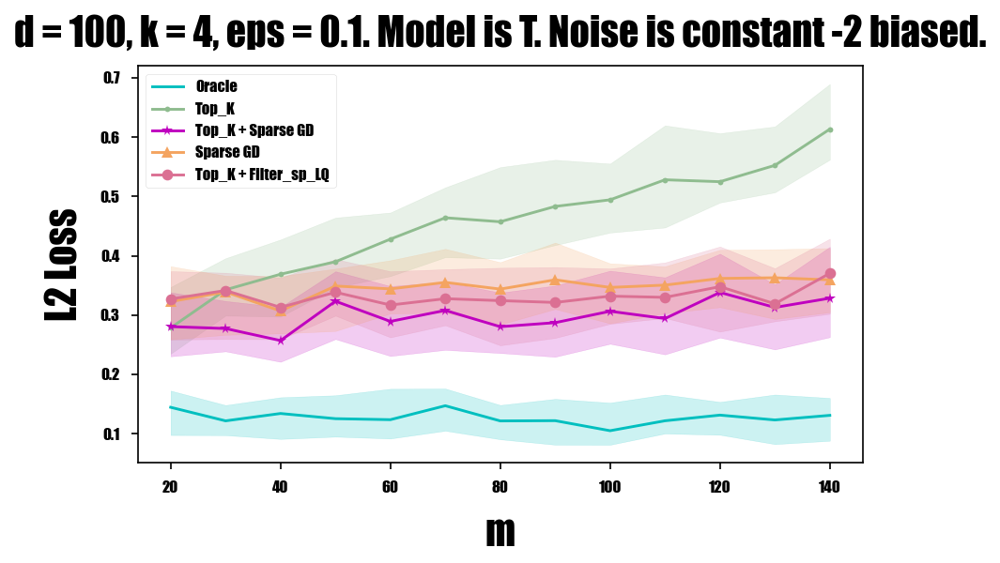

<Figure size 1200x600 with 0 Axes>

In [32]:
"loss vs sample -- T -- dense biased -- plot -- detailed"

il.reload(rl)

trials = 50

d, k, eps, param = 100, 4, 0.1, 2.74
xs = list(np.arange(100, 1000, 50))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.Top_K_Filtered]

model = rl.TModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(d = d, k = k, eps = eps, param = param)
inputfilename = 'data/loss-time-vs-sample-T.pkl'
outputfilename = 'figs/loss-vs-sample-T-detailed.pdf'

title = 'd = {d}, k = {k}, eps = {eps}. Model is T. Noise is constant -2 biased.'.format(d = d, k = k, eps = eps)
xlabel = 'm'
ylabel = 'L2 Loss'

plot_m_loss = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_m_loss.plotxy_fromfile(outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)

In [ ]:
"time vs sample -- T -- dense biased -- plot"

il.reload(rl)

trials = 50

d, k, eps, param = 100, 4, 0.1, 2.74
xs = list(np.arange(100, 1000, 50))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.RME_sp, rl.Top_K_Filtered, rl.RME]

model = rl.TModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(d = d, k = k, eps = eps, param = param)
inputfilename = 'data/loss-time-vs-sample-T.pkl'
outputfilename = 'figs/time-vs-sample-T.pdf'

title = 'd = {d}, k = {k}, eps = {eps}. Model is T. Noise is constant -2 biased.'.format(d = d, k = k, eps = eps)
xlabel = 'm'
ylabel = 'Time'

plot_m_time = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_m_time.plotxy_fromfile_time(outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)

In [ ]:
"time vs sample -- T -- dense biased -- plot -- detailed"

il.reload(rl)

trials = 50

d, k, eps, param = 100, 4, 0.1, 2.74
xs = list(np.arange(100, 1000, 50))

keys = [rl.Oracle, rl.RME_sp, rl.RME]

model = rl.TModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(d = d, k = k, eps = eps, param = param)
inputfilename = 'data/loss-time-vs-sample-T.pkl'
outputfilename = 'figs/time-vs-sample-T-detailed.pdf'

title = 'd = {d}, k = {k}, eps = {eps}. Model is T. Noise is constant -2 biased.'.format(d = d, k = k, eps = eps)
xlabel = 'm'
ylabel = 'Time'

plot_m_time = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_m_time.plotxy_fromfile_time(outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)

In [ ]:
"loss, time vs eps -- T -- dense biased -- set data"

il.reload(rl)

trials = 50

d, k, m, param= 100, 4, 3000, 2.74
xs = list(np.arange(0.01, 0.11, 0.01))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.RME_sp, rl.Top_K_Filtered, rl.RME]

model = rl.TModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(d = d, k = k, m = m, param = param)

inputfilename = 'data/loss-time-vs-eps-T.pkl'
plot_m = rl.load_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)
plot_m.setdata_tofile(filename = inputfilename, xvar_name = 'eps', trials = trials, xs = xs)

In [ ]:
"loss vs eps -- T -- dense biased -- plot"

il.reload(rl)

trials = 50

d, k, m, param = 100, 4, 3000, 2.74
xs = list(np.arange(0.01, 0.11, 0.01))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.RME_sp, rl.Top_K_Filtered, rl.RME]

model = rl.TModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(d = d, k = k, m = m, param = param)
inputfilename = 'data/loss-time-vs-eps-T.pkl'
outputfilename = 'figs/loss-vs-eps-T.pdf'

title = 'd = {d}, k = {k}, m = {m}. Model is T. Noise is constant -2 biased.'.format(d = d, k = k, m = m)
xlabel = 'eps'
ylabel = 'L2 Loss'

plot_eps_loss = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_eps_loss.plotxy_fromfile(outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)

In [ ]:
"loss vs eps -- T -- dense biased -- plot -- detailed"

il.reload(rl)

trials = 50

d, k, m, param = 100, 4, 3000, 2.74
xs = list(np.arange(0.01, 0.11, 0.01))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.Top_K_Filtered, rl.RME_sp]

model = rl.TModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(d = d, k = k, m = m, param = param)
inputfilename = 'data/loss-time-vs-eps-T.pkl'
outputfilename = 'figs/loss-vs-eps-T-detailed.pdf'

title = 'd = {d}, k = {k}, m = {m}. Model is T. Noise is constant -2 biased.'.format(d = d, k = k, m = m)
xlabel = 'eps'
ylabel = 'L2 Loss'

plot_eps_loss = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_eps_loss.plotxy_fromfile(outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)

In [ ]:
"time vs eps -- T -- dense biased -- plot"

il.reload(rl)

trials = 50

d, k, m, param = 100, 4, 3000, 2.74
xs = list(np.arange(0.01, 0.11, 0.01))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.RME_sp, rl.Top_K_Filtered, rl.RME]

model = rl.TModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(d = d, k = k, m = m, param = param)
inputfilename = 'data/loss-time-vs-eps-T.pkl'
outputfilename = 'figs/time-vs-eps-T.pdf'

title = 'd = {d}, k = {k}, m = {m}. Model is T. Noise is constant -2 biased.'.format(d = d, k = k, m = m)
xlabel = 'eps'
ylabel = 'Time'

plot_eps_time = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_eps_time.plotxy_fromfile_time(outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)

In [ ]:
"time vs eps -- T -- dense biased -- plot -- detailed"

il.reload(rl)

trials = 50

d, k, m, param = 100, 4, 3000, 2.74
xs = list(np.arange(0.01, 0.11, 0.01))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.RME_sp, rl.Top_K_Filtered, rl.RME]

model = rl.TModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(d = d, k = k, m = m, param = param)
inputfilename = 'data/loss-time-vs-eps-T.pkl'
outputfilename = 'figs/time-vs-eps-T-detailed.pdf'

title = 'd = {d}, k = {k}, m = {m}. Model is T. Noise is constant -2 biased.'.format(d = d, k = k, m = m)
xlabel = 'eps'
ylabel = 'Time'

plot_eps_time = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_eps_time.plotxy_fromfile_time(outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)

In [4]:
"loss, time vs param -- T -- dense biased -- set data"

il.reload(rl)

trials = 50

d, k, m, eps = 100, 4, 200, 0.05
xs = list(np.arange(2, 3, 0.1))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.RME_sp, rl.Top_K_Filtered, rl.RME]

model = rl.TModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(d = d, k = k, m = m, eps = eps)

inputfilename = 'data/loss-time-vs-param-T.pkl'
plot_m = rl.load_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)
plot_m.setdata_tofile(filename = inputfilename, xvar_name = 'param', trials = trials, xs = xs)

[[  9.53421359  -4.71715235  -2.24847537 ...  -0.14157926   0.33342706
   -0.65469332]
 [  8.48583076  -5.6759739   -2.92484123 ...   1.49221699  -0.59590222
    0.11794398]
 [  9.82052589  -2.9189989    0.37721928 ...   0.03470197  -0.62502244
    0.39471135]
 ...
 [ 10.85767096  -6.77529353  -3.45479598 ...   2.82859223  -0.40261994
   -1.86135246]
 [  6.92892613  -4.08848181  -3.27730565 ...  -3.44998462  -2.26506117
   -1.12456148]
 [ 10.0200436  -10.54358322  -3.76018105 ...  -1.08011131  -2.30461309
   -3.97479419]]
ATTENTION
[[0.7582095207959197],[-2.1549563670449676],[-5.2273584311725285],[9.953607771976337]]
[3 2 1 0]
[ 9.92264507e+00 -5.12813334e+00 -2.04194231e+00  9.48026585e-01
 -5.41460901e-05 -2.88756694e-03  1.76438949e-01 -7.23924787e-06
 -5.41460901e-05 -2.88756694e-03 -5.41460901e-05 -7.23924787e-06
  0.00000000e+00  7.23924787e-06 -7.23924787e-06 -7.23924787e-06
  5.41460901e-05  0.00000000e+00  1.74653120e-02 -2.69391400e-01
  2.09591556e-02  2.88756694e-03  0.0000

/Users/chenruidemac/Documents/GitHub/Robust_mean_estimation/robust_mean_estimate.py:382: RuntimeWarning: invalid value encountered in double_scalars
  else:
/Users/chenruidemac/Documents/GitHub/Robust_mean_estimation/robust_mean_estimate.py:400: RuntimeWarning: invalid value encountered in double_scalars
  else:


Linear filter...
Filtered out 0/146, 0.0 false (nan vs 0.1)
Quadratic filter...
Filtered out 0/146, 0.0 false (nan vs 0.1)
condition 146 146
Could not filter
Linear filter...
Filtered out 0/2, 0.0 false (nan vs 0.1)
Could not filter
[[ 9.96480818 -4.67204216 -1.23722455 ... -3.63351606 -2.50602847
   0.7522267 ]
 [10.08075953 -4.55426835 -2.46680732 ...  0.04310896  3.15755648
  -5.46315049]
 [13.59035255 -3.68474155 -1.75577294 ...  2.03995151  1.89152819
   0.79870874]
 ...
 [ 9.63839289 -6.78424757 -3.60423108 ...  1.09927543 -2.36021326
  -2.2478135 ]
 [ 8.91028669 -8.4202811  -3.88587053 ... -1.49686428 -1.31407361
  -2.19936565]
 [ 7.65880584 -7.25049408 -5.13714549 ... -2.23118023  7.88786974
  -2.35647581]]
ATTENTION
[[0.7989259104382371],[-2.172003109213781],[-5.17146149809566],[9.811578635977648]]
[3 2 1 0]
[ 9.76512635e+00 -5.28547808e+00 -2.19267007e+00  9.37981388e-01
 -5.41460901e-05 -1.89064510e-02  7.23924787e-06 -3.96258008e-04
  7.23924787e-06  2.88756694e-03 -1.47280

/Users/chenruidemac/Documents/GitHub/Robust_mean_estimation/robust_mean_estimate.py:357: RuntimeWarning: divide by zero encountered in true_divide
  def linear_filter(self, S, indicator, ev, v, u):


ATTENTION
[[0.9489947353892824],[-2.135102405864561],[-5.195149675996667],[9.857010493277421]]
[3 2 1 0]
[ 1.00414674e+01 -5.00914608e+00 -2.11559739e+00  1.12207619e+00
 -3.96258008e-04  5.23939314e-02  5.41460901e-05 -3.96258008e-04
  2.09591556e-02 -7.23924787e-06  2.88756694e-03  2.09591556e-02
 -5.41460901e-05 -1.59432784e-02 -2.88756694e-03 -1.71915676e-01
  3.96258008e-04  0.00000000e+00 -9.53432760e-02  7.23924787e-06
 -2.88756694e-03 -5.41460901e-05  2.09591556e-02 -7.23924787e-06
 -9.95851500e-02 -3.96258008e-04 -2.88756694e-03 -7.23924787e-06
  5.41460901e-05 -2.09591556e-02 -1.19513195e-01  7.23924787e-06
  3.96258008e-04 -5.41460901e-05  1.73962109e-02 -7.23924787e-06
 -2.72892839e-01 -7.23924787e-06 -7.23924787e-06  0.00000000e+00
  0.00000000e+00 -6.02409213e-02 -2.88756694e-03 -7.23924787e-06
  5.41460901e-05 -2.88756694e-03  0.00000000e+00 -7.23924787e-06
 -5.41460901e-05  5.41460901e-05  0.00000000e+00 -3.96258008e-04
 -7.23924787e-06 -7.23924787e-06 -1.96121726e-01 -

AttributeError: 'XAxis' object has no attribute '_gridOnMajor'

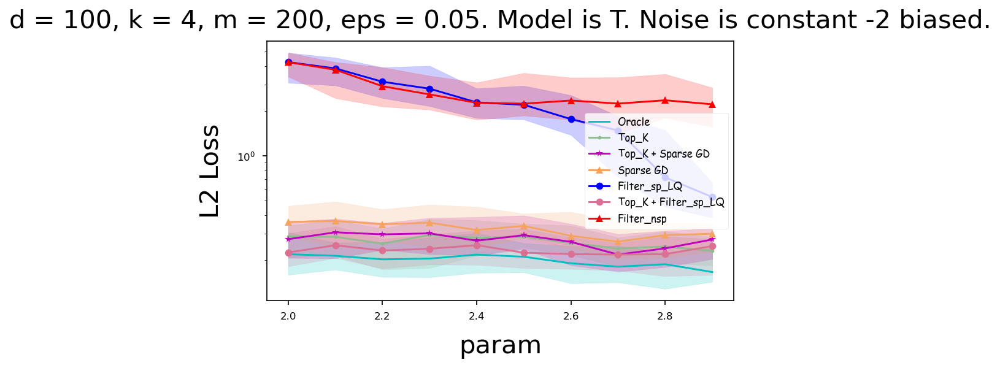

<Figure size 1200x600 with 0 Axes>

In [5]:
"loss vs param -- T -- dense biased -- plot"

il.reload(rl)

trials = 50

d, k, m, eps = 100, 4, 200, 0.05
xs = list(np.arange(2, 3, 0.1))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.RME_sp, rl.Top_K_Filtered, rl.RME]

model = rl.TModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(d = d, k = k, m = m, eps = eps)
inputfilename = 'data/loss-time-vs-param-T.pkl'
outputfilename = 'figs/loss-vs-param-T.pdf'

title = 'd = {d}, k = {k}, m = {m}, eps = {eps}. Model is T. Noise is constant -2 biased.'.format(d = d, k = k, m = m, eps = eps)
xlabel = 'param'
ylabel = 'L2 Loss'

plot_eps_loss = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_eps_loss.plotxy_fromfile(yscale = 'log', outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)

AttributeError: 'XAxis' object has no attribute '_gridOnMajor'

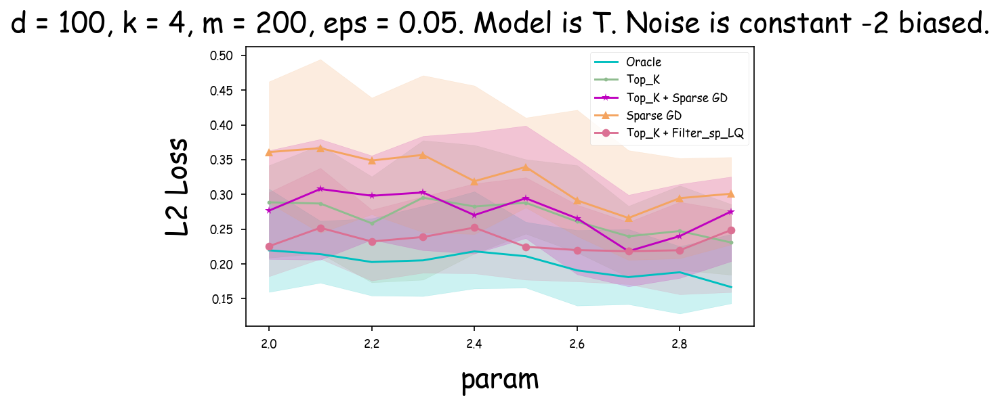

<Figure size 1200x600 with 0 Axes>

In [6]:
"loss vs param -- T -- dense biased -- plot -- detailed"

il.reload(rl)

trials = 50

d, k, m, eps = 100, 4, 200, 0.05
xs = list(np.arange(2, 3, 0.1))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.Top_K_Filtered]

model = rl.TModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(d = d, k = k, m = m, eps = eps)
inputfilename = 'data/loss-time-vs-param-T.pkl'
outputfilename = 'figs/loss-vs-param-T-detailed.pdf'

title = 'd = {d}, k = {k}, m = {m}, eps = {eps}. Model is T. Noise is constant -2 biased.'.format(d = d, k = k, m = m, eps = eps)
xlabel = 'param'
ylabel = 'L2 Loss'

plot_eps_loss = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_eps_loss.plotxy_fromfile(outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)